# Scanpy workflow


This is based on the following notebooks
https://colab.research.google.com/github/pachterlab/kallistobustools/blob/master/notebooks/kb_analysis_0_python.ipynb#scrollTo=x-bSAmqCCoRa

https://github.com/velocyto-team/velocyto-notebooks/blob/master/python/hgForebrainGlutamatergic.ipynb

## Install dependencies

Mount GoogleDrive if not already monted

In [ ]:
from google.colab import drive
from os.path import join
ROOT = '/content/drive'     # default for the drive
PROJ = 'My Drive/Mp_scRNA-seq'       # path to your project on Drive
drive.mount(ROOT)           # we mount the drive at /content/drive

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Install required packages

In [ ]:
!pip install scanpy loompy scvelo anndata velocyto python-igraph louvain leidenalg

In [ ]:
!pip install git+https://github.com/pachterlab/kb_python@count-kite

  Cloning https://github.com/pachterlab/kb_python (to revision count-kite) to /tmp/pip-req-build-9xzt59qz
  Running command git clone -q https://github.com/pachterlab/kb_python /tmp/pip-req-build-9xzt59qz
  Running command git checkout -q count-kite
  error: pathspec 'count-kite' did not match any file(s) known to git.
ERROR: Command errored out with exit status 1: git checkout -q count-kite Check the logs for full command output.


Change to correct directory if not already there

In [ ]:
cd drive/My\ Drive/Mp_scRNA-seq/analysis/

/content/drive/My Drive/Mp_scRNA-seq/analysis


In [ ]:
import numpy as np
import pandas as pd
import scanpy as sc
import scvelo as scv
import anndata
from sklearn.decomposition import TruncatedSVD
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=120)

## QC

### Pre processing

Create adata object

In [ ]:
# load the unfiltered matrix
results_file = '51_Mp.h5ad'  # the file that will store the analysis results
adata = anndata.read_h5ad("../tak_51/counts_unfiltered/adata.h5ad")
adata.var["gene"] = adata.var.index.values

t2g = pd.read_csv("../index/t2g.txt", header=None, names=["tid", "gene_id", "gene_name", "NA", "chr", "start", "end", "strand"], sep="\t")
t2g.index = t2g.gene_id
t2g.gene_name = t2g.gene_id
t2g = t2g.loc[~t2g.index.duplicated(keep='first')]

adata.var["gene_name"] = adata.var.gene.map(t2g["gene_id"])
#adata.var.index = adata.var["gene_name"]

adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

Testing for library saturation

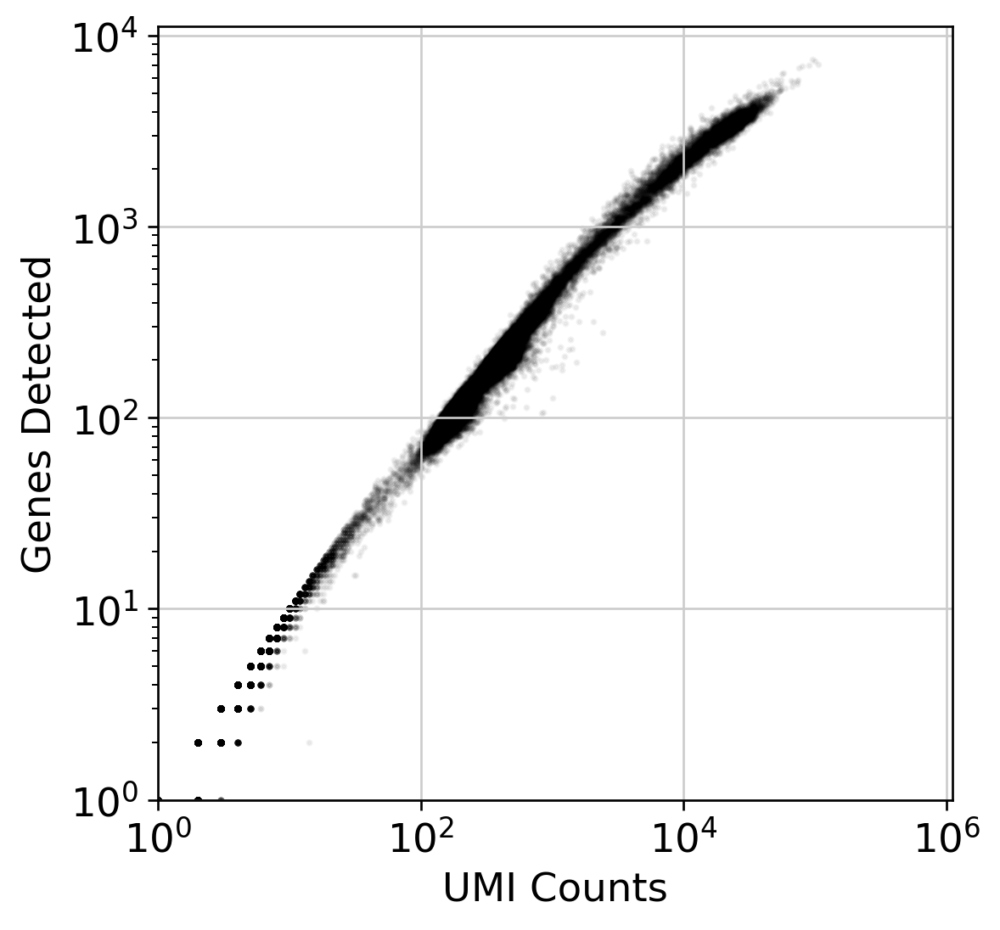

In [ ]:
# Create a plot showing genes detected as a function of UMI counts.
fig, ax = plt.subplots(figsize=(5, 5))

x = np.asarray(adata.X.sum(axis=1))[:,0]
y = np.asarray(np.sum(adata.X>0, axis=1))[:,0]

ax.scatter(x, y, color="black", alpha=0.05, s=2)
ax.set_xlabel("UMI Counts")
ax.set_ylabel("Genes Detected")
ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlim(1)
ax.set_ylim(1)

plt.savefig('figures/lib_saturation.png')
plt.show()

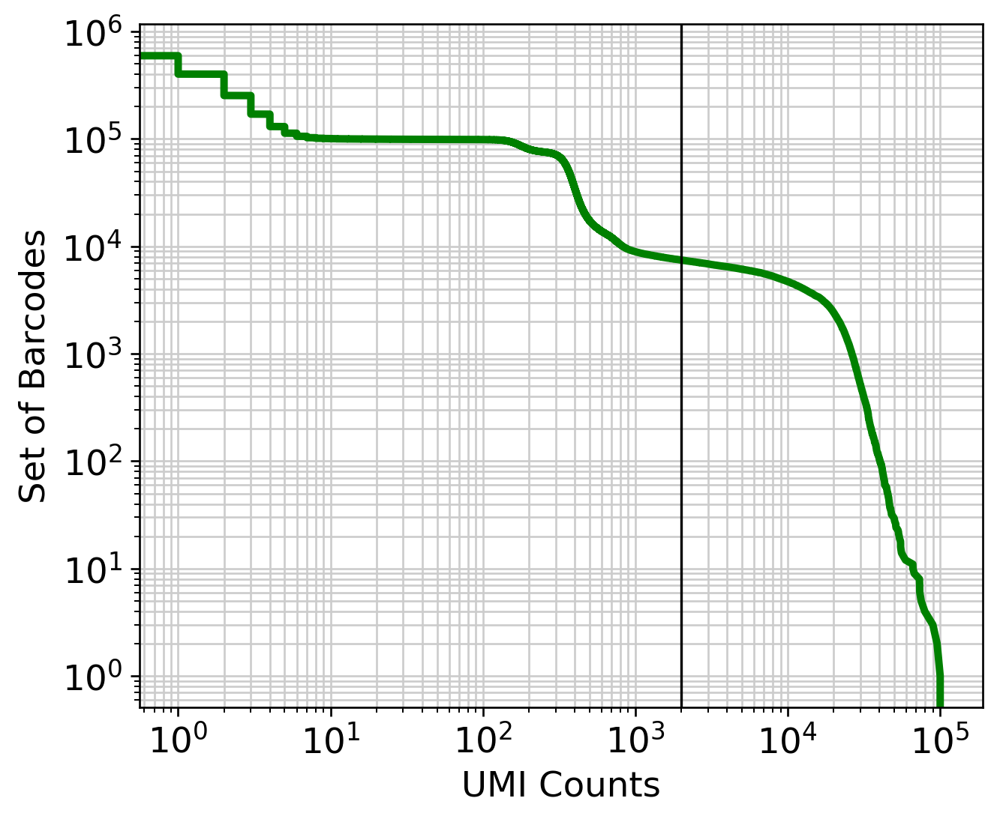

In [ ]:

knee = np.sort((np.array(adata.X.sum(axis=1))).flatten())[::-1]

UMI_threshold = 2000

fig, ax = plt.subplots(figsize=(6, 5))

ax.loglog(knee, range(len(knee)), linewidth=3, color="g")
ax.axvline(x=UMI_threshold, linewidth=1, color="k")

ax.set_xlabel("UMI Counts")
ax.set_ylabel("Set of Barcodes")

plt.grid(True, which="both")

plt.savefig('figures/kneeplot.png')
plt.show()

### Filtering

In [ ]:
# Removes cells with less than 2000 umi counts
adata = adata[np.asarray(adata.X.sum(axis=1)).reshape(-1) > UMI_threshold]

# Removes cells with less than 200 detected genes
sc.pp.filter_cells(adata, min_genes=200)

# Removes genes expressed in fewer than 2 cells
sc.pp.filter_genes(adata, min_cells=2)

Trying to set attribute `.obs` of view, copying.


In [ ]:
# dimensions post filtering
adata


In [ ]:
# save barcodes cell IDs and expression matrix/adata object for reference
pd.DataFrame(adata.obs.index).to_csv("barcodes_f.txt", header=False, index=False)
pd.DataFrame(adata.var.index).to_csv("genes_f.txt", header=False, index=False)

adata.write("5.1_f_raw.h5ad")


### QC plots

normalizing counts per cell
    finished (0:00:00)


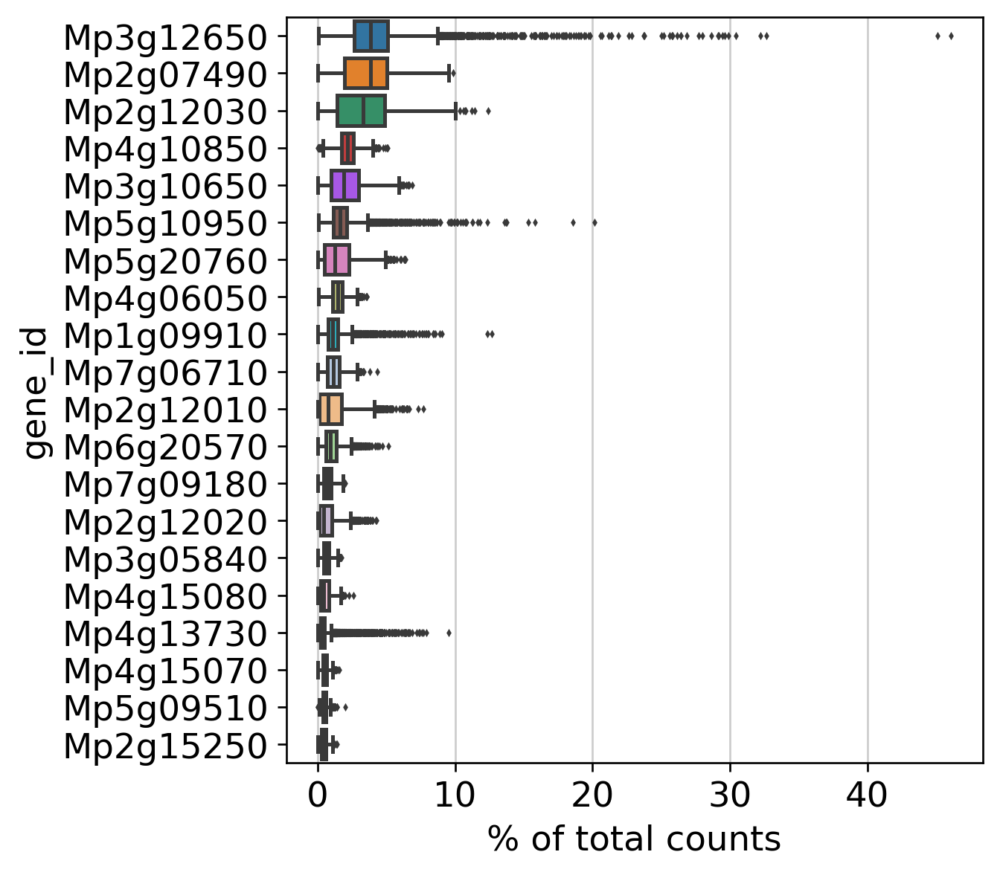

In [ ]:
# Plot highest expressed genes 
sc.pl.highest_expr_genes(adata, n_top=20)

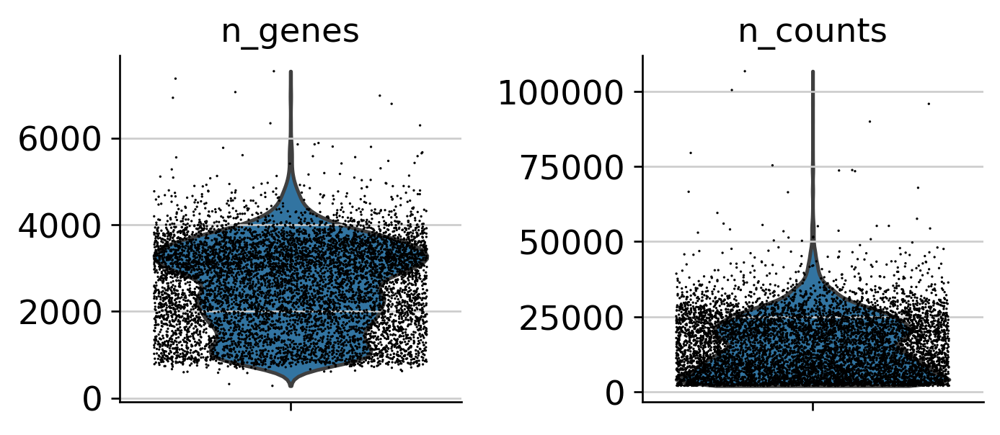

In [ ]:
adata.obs['n_counts'] = adata.X.sum(axis=1).A1
sc.pl.violin(adata, ['n_genes', 'n_counts'],
             jitter=0.4, multi_panel=True, save="_counts.png")

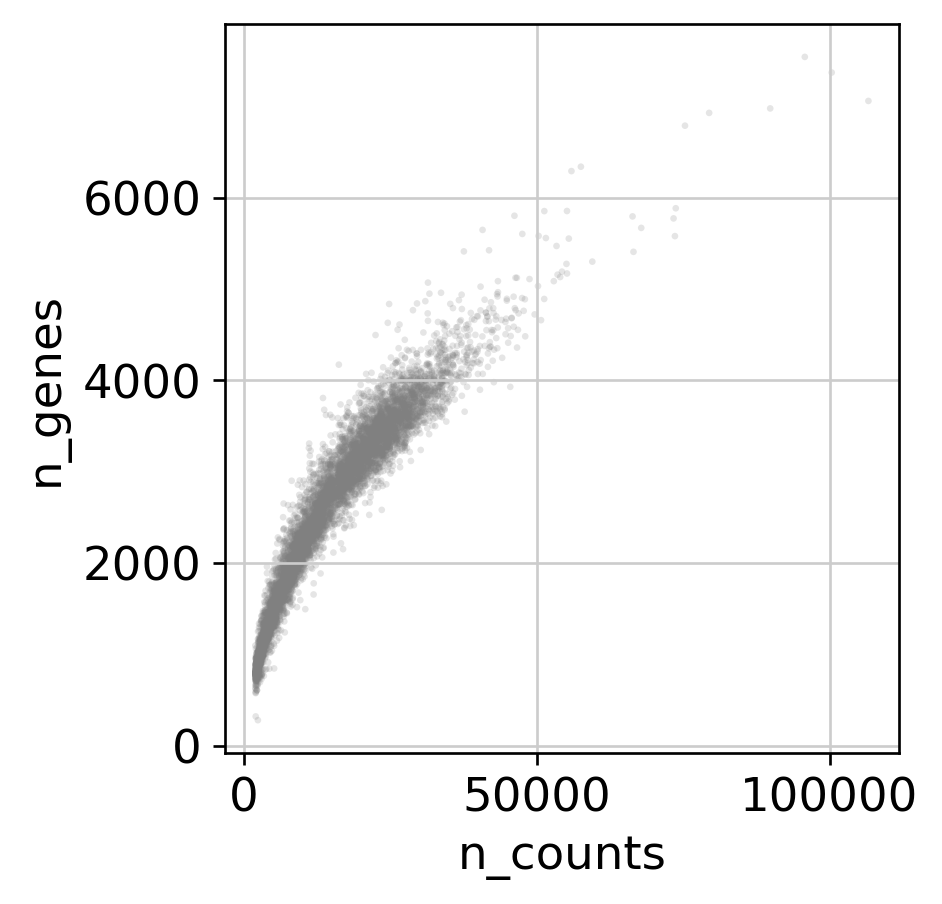

In [ ]:
sc.pl.scatter(adata, x='n_counts', y='n_genes', alpha=0.2)

## Analysis

### Normalisation

In [ ]:
# set raw data attribute to freeze for later
adata.raw = adata
# normalize counts in each cell to be equal
sc.pp.normalize_total(adata, target_sum=10**4)
# Replace raw counts with their logarithm
sc.pp.log1p(adata)


normalizing counts per cell
    finished (0:00:00)


normalizing counts per cell
    finished (0:00:00)


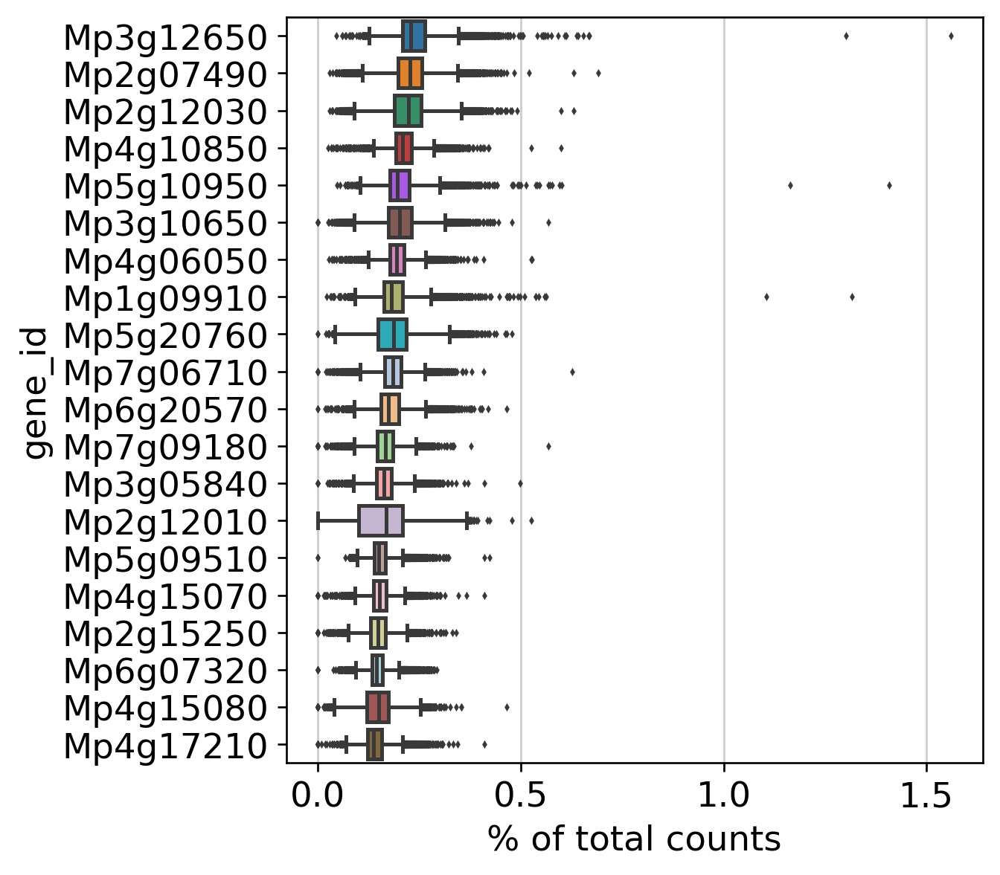

In [ ]:
sc.pl.highest_expr_genes(adata, n_top=20)

Identify highly variable genes

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


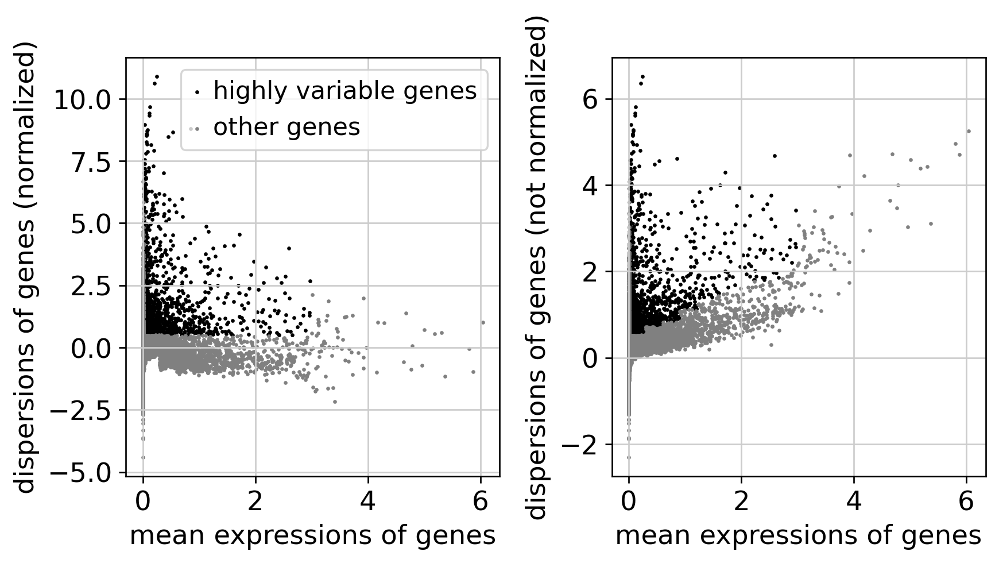

In [ ]:
# flavor="cell_ranger" is consistent with Seurat and flavor="suerat" is not consistent with Seurat
sc.pp.highly_variable_genes(adata,  flavor="seurat") # min_mean=0.01, max_mean=8, min_disp=1, n_top_genes=2000,flavor="cell_ranger",
sc.pl.highly_variable_genes(adata)

Scale each gene to unit variance. Clip values exceeding standard deviation 10.

In [ ]:
sc.pp.scale(adata, max_value=10)

# Check if neccessry, can cause more problems than good
#sc.pp.regress_out(adata, 'n_counts')

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


### PCA

In [ ]:
# We perform PCA on just the highly variable genes
sc.tl.pca(adata, svd_solver='arpack', use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


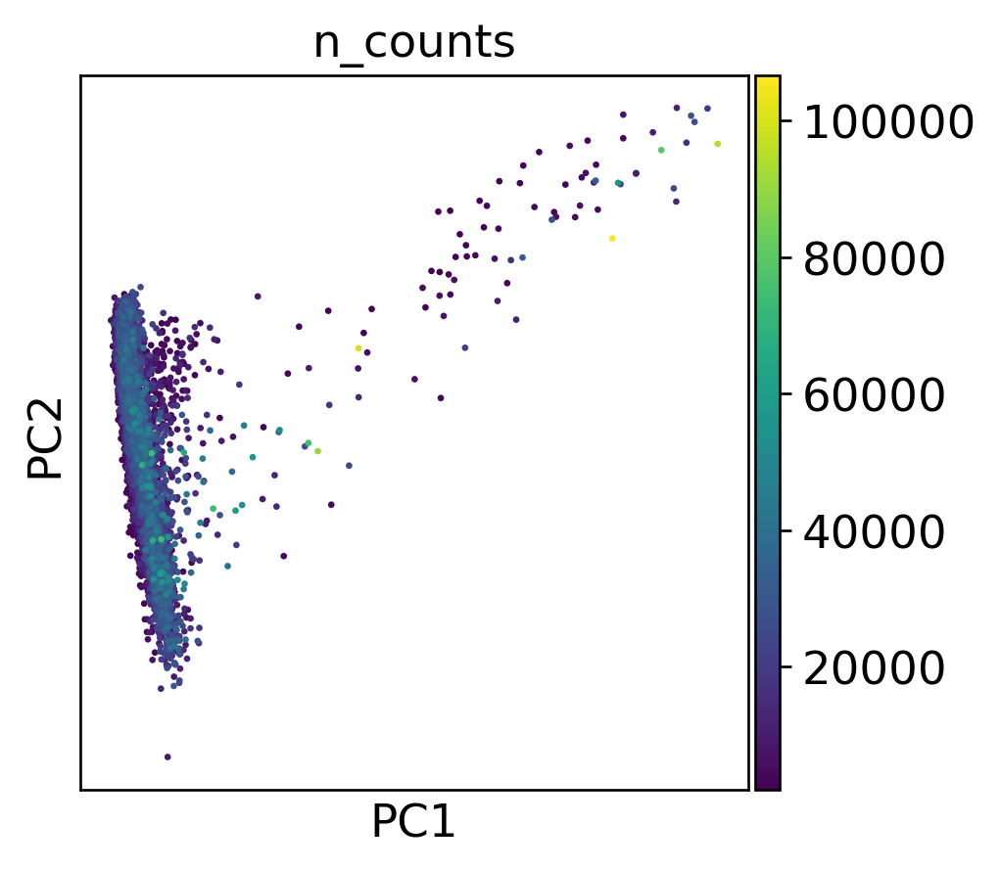

In [ ]:
sc.pl.pca(adata, color='n_counts')

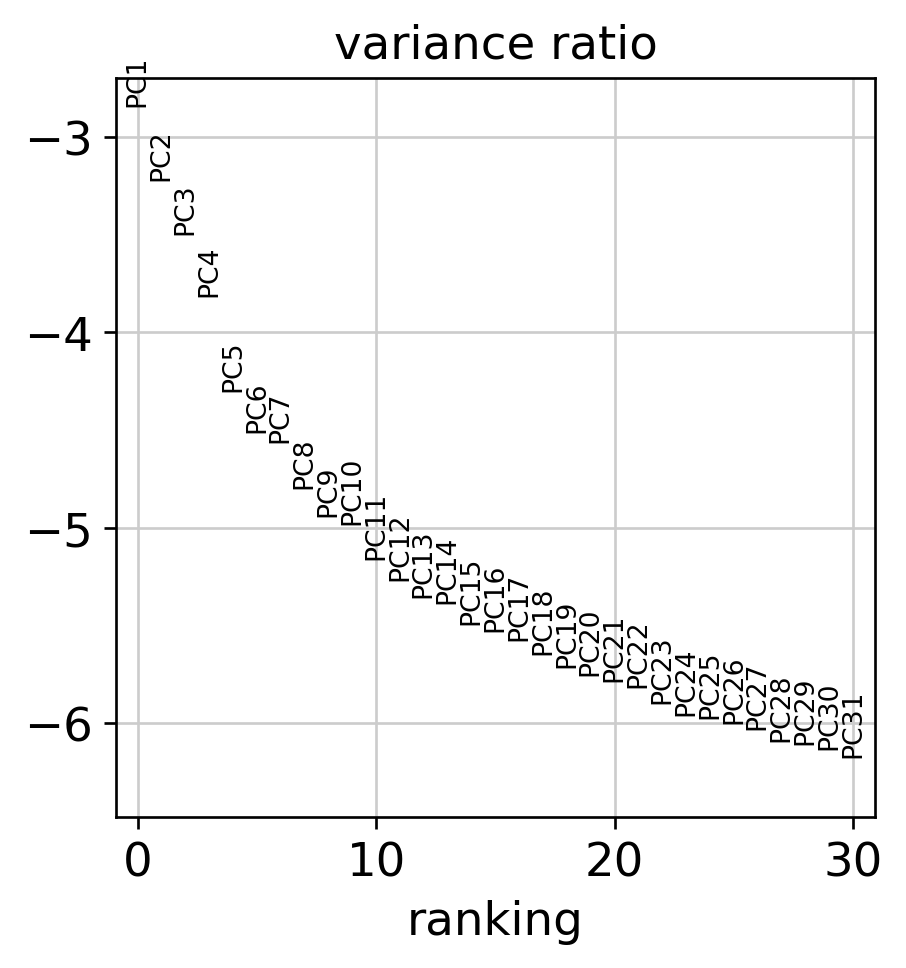

In [ ]:
sc.pl.pca_variance_ratio(adata, log=True)

In [ ]:
adata

AnnData object with n_obs × n_vars = 7456 × 16682 
    obs: 'n_genes', 'n_counts'
    var: 'gene', 'gene_name', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

### Neighbourhood graph, UMAP, Clustering

In [ ]:
sc.pp.neighbors(adata, n_neighbors = 50, n_pcs=20) # n_neigh 60, n_pcs 50 ; n_neighbors = 60, n_pcs=20

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


In [ ]:
sc.tl.umap(adata, min_dist=0.1) # min_dist 0.05

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:32)


In [ ]:
# rotating UMAP plot by 90 degrees anticlockwise
adata.obsm['X_umap'] = np.column_stack((-1*(adata.obsm['X_umap'][:,1]), adata.obsm['X_umap'][:,0]))


In [ ]:
sc.tl.leiden(adata, resolution = 0.95)
#sc.tl.leiden(adata, resolution = 1.1) #, resolution = 0.95

running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:06)


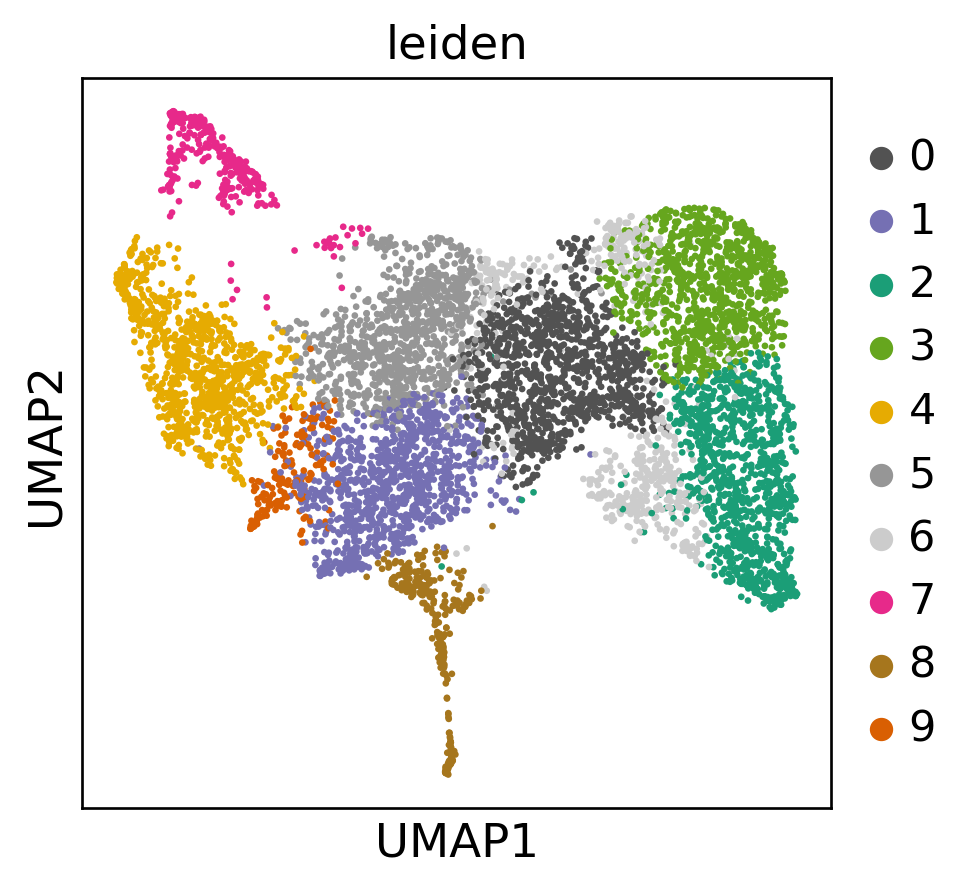

In [ ]:
sc.pl.umap(adata, color='leiden')

Save UMAP projection genes and leiden clusters

In [ ]:
umap = adata.obsm["X_umap"]
np.savetxt("umap.csv", umap, delimiter=",")
pd.DataFrame(adata.obs).to_csv("obs.txt", header=True, index=True)
pd.DataFrame(adata.var).to_csv("var.txt", header=True, index=True)

Stopping point, save adata object

In [ ]:
adata.write("5.1_all.h5ad")

## Plot marker genes

### Cell type identification

In [ ]:
adata.obs['leiden_anno'] = adata.obs['leiden']

# Rename cluster
adata.obs['leiden_anno'].cat.categories = ['Parenchyma (0)', 'Ventral (1)', 'Air chamber (2)', 'Dorsal 3 (3)', 'TA (4)', 'Dorsal 1 (5)', 'Dorsal 2 (6)', 'Apical cells (7)', 'Rhizoids (8)', 'unknown (9)']

# Reorder clusters
adata.obs['leiden_anno']=pd.Series(pd.Categorical(adata.obs['leiden_anno'], 
                                                  categories=[ 'Apical cells (7)', 'TA (4)', 'Dorsal 1 (5)',  'Dorsal 2 (6)', 'Dorsal 3 (3)', 'Air chamber (2)', 'Parenchyma (0)', 'Ventral (1)', 'unknown (9)', 'Rhizoids (8)']),
                                   index=adata.obs_names)

# define marker genes 
marker_genes_dict = {'Meristematic': ['Mp7g09490','Mp3g19510', 'Mp4g01930', 'Mp5g09710','Mp8g07390', 'Mp4g00550', 'Mp2g07150','Mp2g25940','Mp3g23400','Mp6g04830', 'Mp2g16560',  'Mp2g20990'],
                     'Non-meristematic': ['Mp3g20970','Mp1g11660', 'Mp3g12980', 'Mp4g22890', 'Mp6g02620'],
                     'Air-chamber': ['Mp1g09500'],
                     'Rhizoids': [ 'Mp3g17930', 'Mp2g00330', 'Mp2g18610']
                     } # 'Epidermal' : ['Mp1g24140', 'Mp7g09710'],

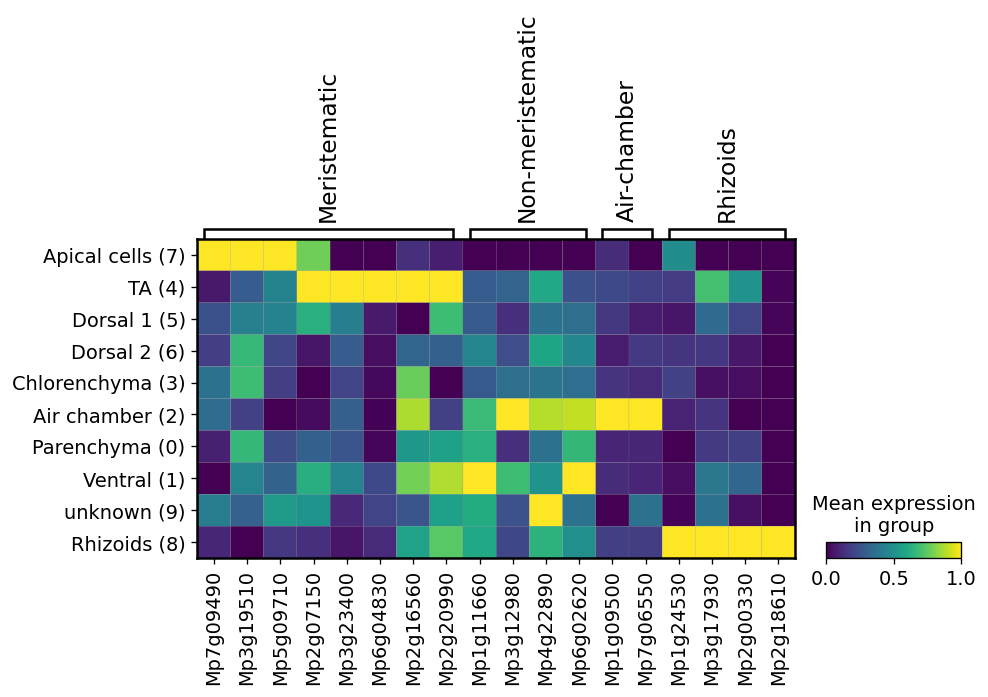

In [ ]:
sc.pl.matrixplot(adata, marker_genes_dict, groupby='leiden_anno', standard_scale='var', use_raw=True, save="_markers_long.pdf")

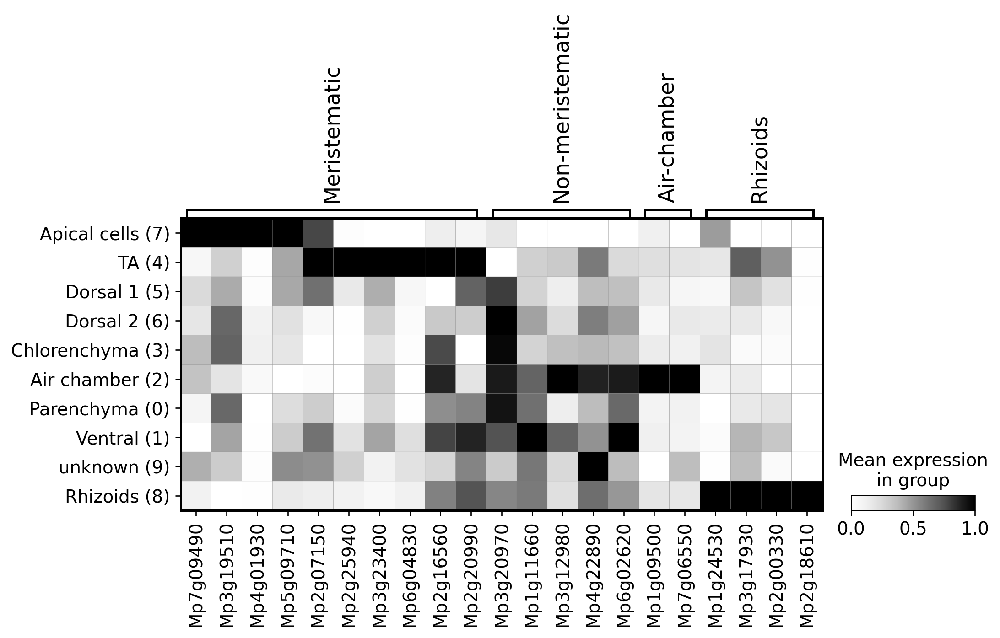

In [ ]:
sc.pl.matrixplot(adata, marker_genes_dict, groupby='leiden_anno', standard_scale='var', use_raw=True, cmap='Greys',save="_markers_bw_long_2.pdf")

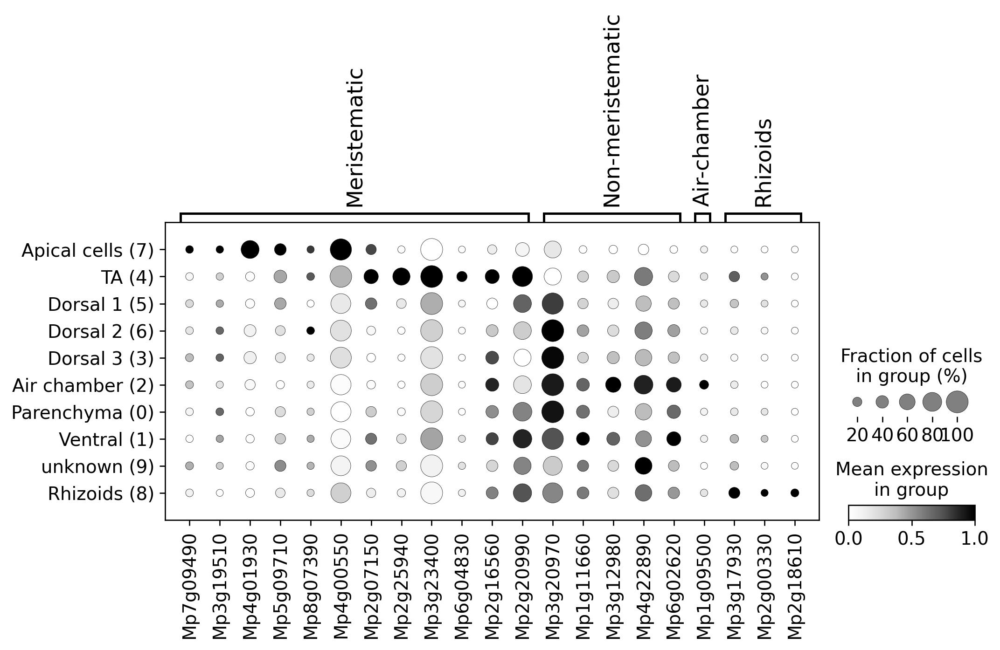

In [ ]:
sc.pl.dotplot(adata, marker_genes_dict, groupby='leiden_anno', standard_scale='var', use_raw=True, cmap='Greys', smallest_dot=20, save="_markers_bw_long_new.pdf")

In [ ]:
 sc.tl.rank_genes_groups(adata, groupby='leiden_anno', method='logreg')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:01:07)


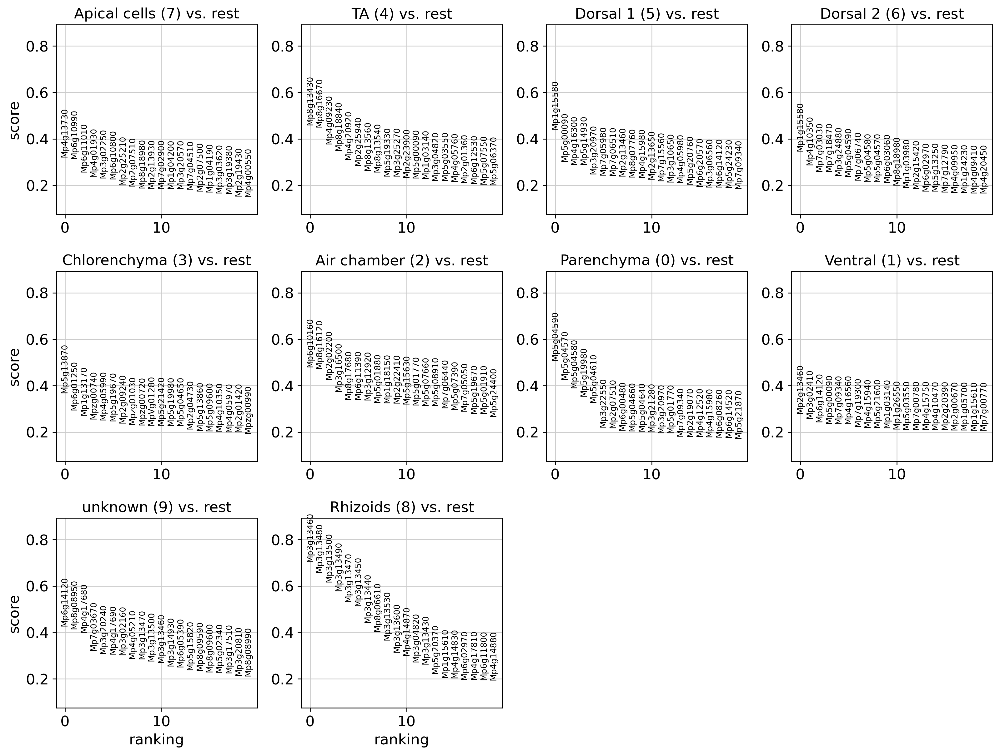

In [ ]:
sc.pl.rank_genes_groups(adata)

In [ ]:
pd.DataFrame.from_records(adata.uns['rank_genes_groups']['names']).to_csv('all_logreg.csv')

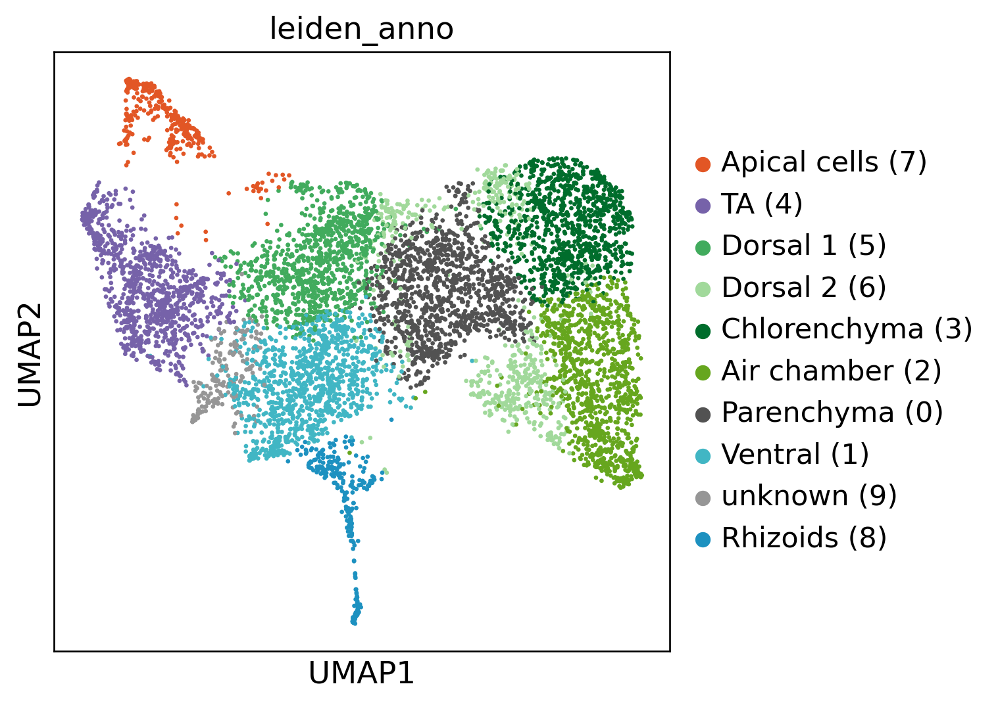

In [ ]:
sc.settings.set_figure_params(figsize=(5,5), dpi=120)
sc.pl.umap(adata, color='leiden_anno', palette= ['#E25625','#7662A9','#41ab5d','#a1d99b','#006d2c','#66a61e','#525252','#41b6c4','#969696', '#1d91c0'], save=".pdf")
sc.settings.set_figure_params(figsize=None, dpi=120)

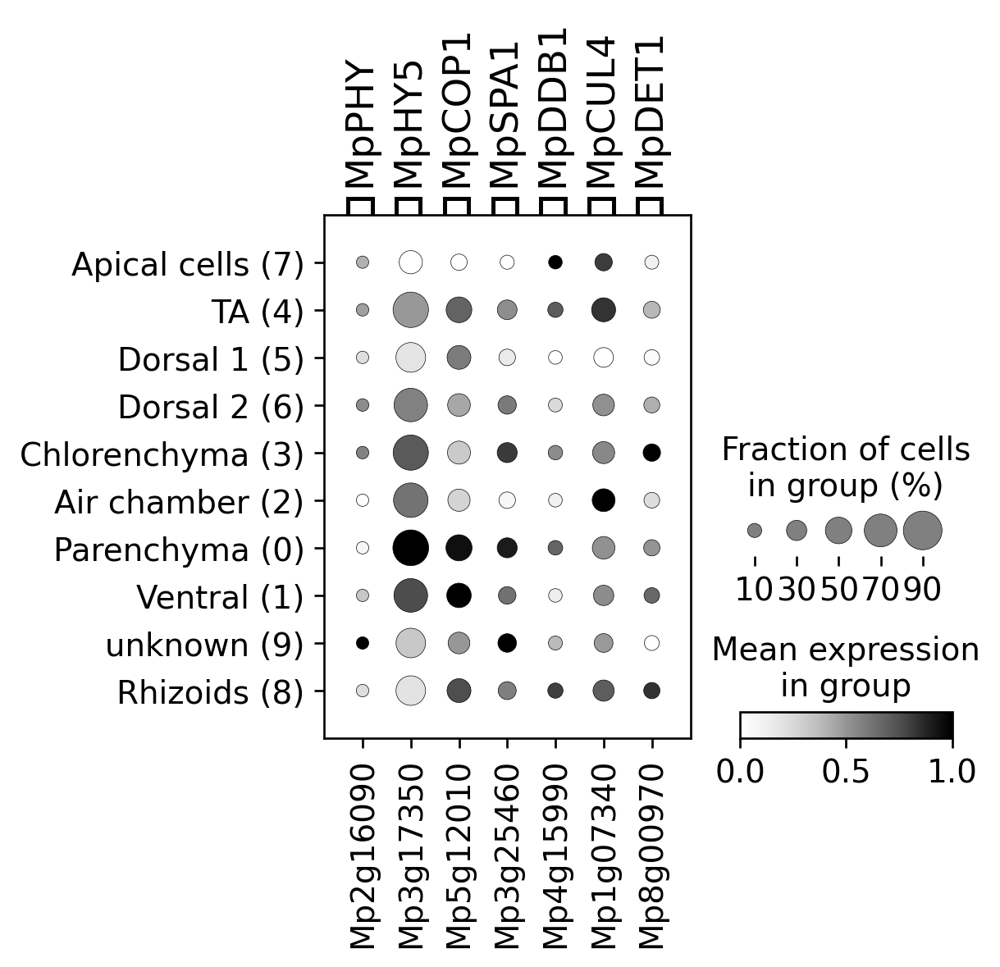

In [ ]:
COP1_genes_dict = {  'MpPHY': 'Mp2g16090',
                     'MpHY5':'Mp3g17350',
                     'MpCOP1': 'Mp5g12010',
                     'MpSPA1': 'Mp3g25460',
                     'MpDDB1': 'Mp4g15990',
                     'MpCUL4': 'Mp1g07340', 
                     'MpDET1': 'Mp8g00970'} 
sc.pl.dotplot(adata, COP1_genes_dict, groupby='leiden_anno',  cmap='Greys', standard_scale='var', save="_Cop1.pdf",smallest_dot=20)

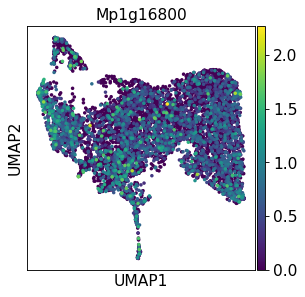

In [ ]:
sc.settings.set_figure_params(dpi=80)
sc.pl.umap(adata, color=['Mp1g16800'],size=40, save="_MpHY5.pdf")
sc.settings.set_figure_params(dpi=120)

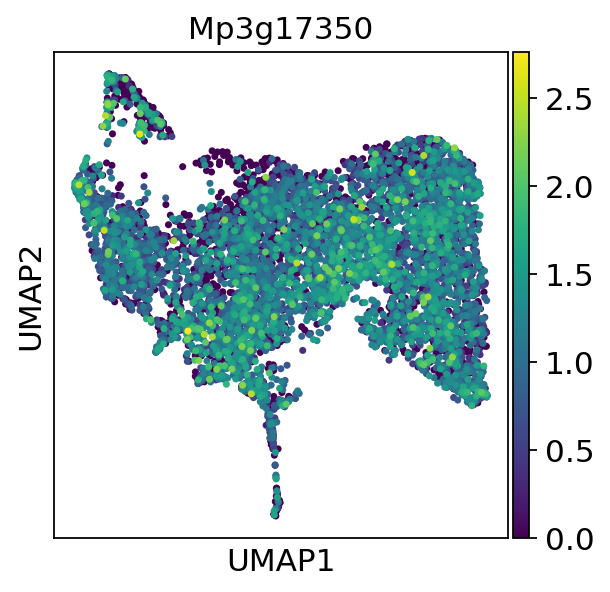

In [ ]:
sc.settings.set_figure_params(dpi=80)
sc.pl.umap(adata, color=['Mp3g17350'],size=40, save="_MpPIF.pdf")
sc.settings.set_figure_params(dpi=120)

In [ ]:
adata = anndata.read_h5ad("5.1_all.h5ad")
adata

AnnData object with n_obs × n_vars = 7456 × 16682
    obs: 'n_genes', 'n_counts', 'leiden', 'leiden_anno', 'leiden_R', 'Photosynthesis', 'Cell_wall', 'Cell_cycle', 'Mitosis', 'Test', 'Carbohydrate Metabolism', 'Fatty Acid Synthesis', 'Cytoskeleton', 'Auxin_response', 'Replication', 'Cell_division', 'ABA_response'
    var: 'gene', 'gene_name', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'percent_zero', 'UMI_count'
    uns: 'leiden', 'leiden_R_colors', 'leiden_colors', 'leiden_sizes', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

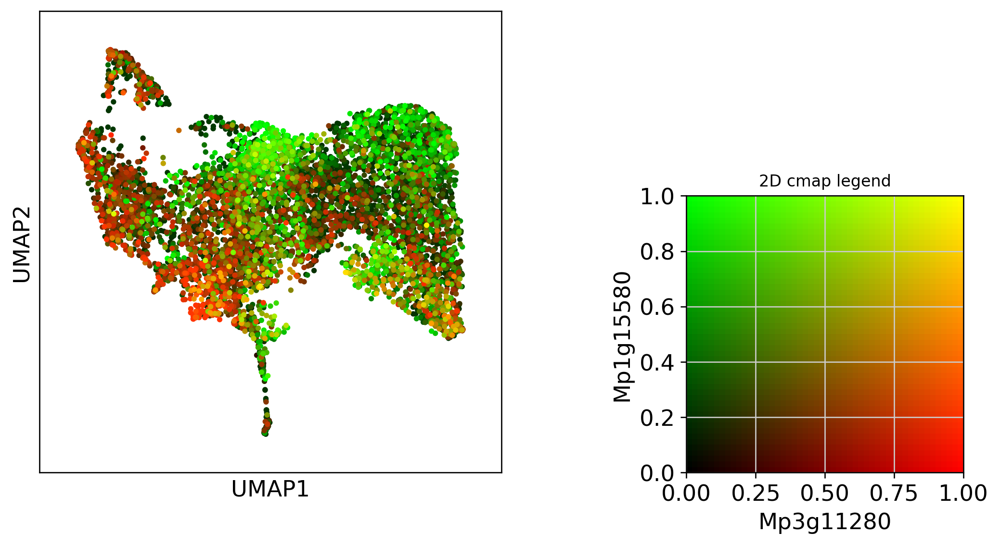

In [ ]:

def NormalizeClipData(data):
    data = np.where(data < np.percentile(data, 99), data, np.percentile(data, 99))
    return (data - np.min(data)) / (np.max(data) - np.min(data))

def NormalizeData(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

x = NormalizeData(adata.obsm['X_umap'][:,0]) 
y = NormalizeData(adata.obsm['X_umap'][:,1]) 
p2 = NormalizeClipData(adata.X[:,adata.var['gene_name']=='Mp1g15580']).flatten() 
p1 = NormalizeClipData(adata.X[:,adata.var['gene_name']=='Mp3g11280']).flatten() 

order = np.argsort(p1+p2)
x = x[order[::1]]
y = y[order[::1]]
p2 = p2[order[::1]]
p1 = p1[order[::1]]

fig, ax = plt.subplots(figsize=(8, 8))
ax.set_aspect("equal")

# create a very simple colormap, 
#  mapping parameter 1 to the red channel and 
#          parameter 2 to the green channel
cmap = lambda p1,p2 : (p1, p2, 0)

# put shapes at positions (x[i], y[i]) and colorize them with our
# cmap according to their respective parameters
for i in range(len(x)):
    circle = plt.Circle((x[i], y[i]), 0.005, color=cmap(p1[i],p2[i]))
    ax.add_artist(circle)
    

ax.set_xlim(-0.1,1.1)
ax.set_ylim(-0.1,1.1)
ax.set_xlabel("UMAP1")
ax.set_ylabel("UMAP2")
plt.xticks([], [])
ax.set_xticks([], minor=True)
plt.yticks([], [])
ax.set_yticks([], minor=True)

# create the legend:

plt.subplots_adjust(left=0, right=0.5, top=1, bottom=0.5)
cax = fig.add_axes([0.7,0.5,0.3,0.3])
cp1 = np.linspace(0,1)
cp2 = np.linspace(0,1)
Cp1, Cp2 = np.meshgrid(cp1,cp2)
C0 = np.zeros_like(Cp1)
# make RGB image, p1 to red channel, p2 to blue channel
Legend = np.dstack((Cp1, Cp2, C0))
# parameters range between 0 and 1
cax.imshow(Legend, origin="lower", extent=[0,1,0,1])
cax.set_xlabel("Mp3g11280")
cax.set_ylabel("Mp1g15580")
cax.set_title("2D cmap legend", fontsize=10)

ax.grid(False)
plt.savefig('figures/Mp3g11280_Mp1g15580_2D_col.pdf')
plt.show()

### Biological processes

In [ ]:

gene_func = pd.read_table('../genome/annotation/MpTak_v6.1_func_annotation.tsv')

photosynthesis = gene_func[gene_func['ref_id'].isin(['GO:0015979'])]['gene_id'].str.split('.').str[0].drop_duplicates()
photosynthesis = photosynthesis[photosynthesis.isin(adata[:,adata.var['means'] > 0.1].var['gene_name'])]
cell_wall = gene_func[gene_func['ref_id'].isin(['GO:0042546', 'GO:0030244'])]['gene_id'].str.split('.').str[0].drop_duplicates()
cell_wall = cell_wall[cell_wall.isin(adata[:,adata.var['means'] > 0.1].var['gene_name'])]
expansin = gene_func[gene_func['ref_id'].isin(['PR01226'])]['gene_id'].str.split('.').str[0].drop_duplicates()
expansin = expansin[expansin.isin(adata[:,adata.var['means'] > 0.1].var['gene_name'])]
cytoskeleton = gene_func[gene_func['ref_id'].isin(['GO:0005200'])]['gene_id'].str.split('.').str[0].drop_duplicates()
cytoskeleton = cytoskeleton[cytoskeleton.isin(adata[:,adata.var['means'] > 0.1].var['gene_name'])]
auxin_response = gene_func[gene_func['ref_id'].isin(['PF02519'])]['gene_id'].str.split('.').str[0].drop_duplicates()
auxin_response = auxin_response[auxin_response.isin(adata[:,adata.var['means'] > 0.1].var['gene_name'])]
replication = gene_func[gene_func['ref_id'].isin(['GO:0006270'])]['gene_id'].str.split('.').str[0].drop_duplicates()
replication = auxin_response[auxin_response.isin(adata[:,adata.var['means'] > 0.1].var['gene_name'])]
cell_division = gene_func[gene_func['ref_id'].isin(['GO:0051301'])]['gene_id'].str.split('.').str[0].drop_duplicates()
cell_division = auxin_response[auxin_response.isin(adata[:,adata.var['means'] > 0.1].var['gene_name'])]




sc.tl.score_genes(adata, gene_list = photosynthesis, score_name="Photosynthesis")
sc.tl.score_genes(adata, gene_list = cell_wall, score_name="Cell_wall")
sc.tl.score_genes(adata, gene_list = cytoskeleton, score_name="Cytoskeleton")
sc.tl.score_genes(adata, gene_list = auxin_response, score_name="Auxin_response")
sc.tl.score_genes(adata, gene_list = replication, score_name="Replication")
sc.tl.score_genes(adata, gene_list = cell_division, score_name="Cell_division")



computing score 'Photosynthesis'
    finished: added
    'Photosynthesis', score of gene set (adata.obs).
    347 total control genes are used. (0:00:00)
computing score 'Cell_wall'
    finished: added
    'Cell_wall', score of gene set (adata.obs).
    349 total control genes are used. (0:00:00)
computing score 'Cytoskeleton'
    finished: added
    'Cytoskeleton', score of gene set (adata.obs).
    348 total control genes are used. (0:00:00)
computing score 'Auxin_response'
    finished: added
    'Auxin_response', score of gene set (adata.obs).
    248 total control genes are used. (0:00:00)
computing score 'Replication'
    finished: added
    'Replication', score of gene set (adata.obs).
    248 total control genes are used. (0:00:00)
computing score 'Cell_division'
    finished: added
    'Cell_division', score of gene set (adata.obs).
    248 total control genes are used. (0:00:00)


In [ ]:
sc.pl.umap(adata, color=['Photosynthesis', 'Cell_wall', 'Cell_division','Cytoskeleton','Replication', 'Auxin_response'], color_map='inferno', save='_metagene.pdf')

Output hidden; open in https://colab.research.google.com to view.

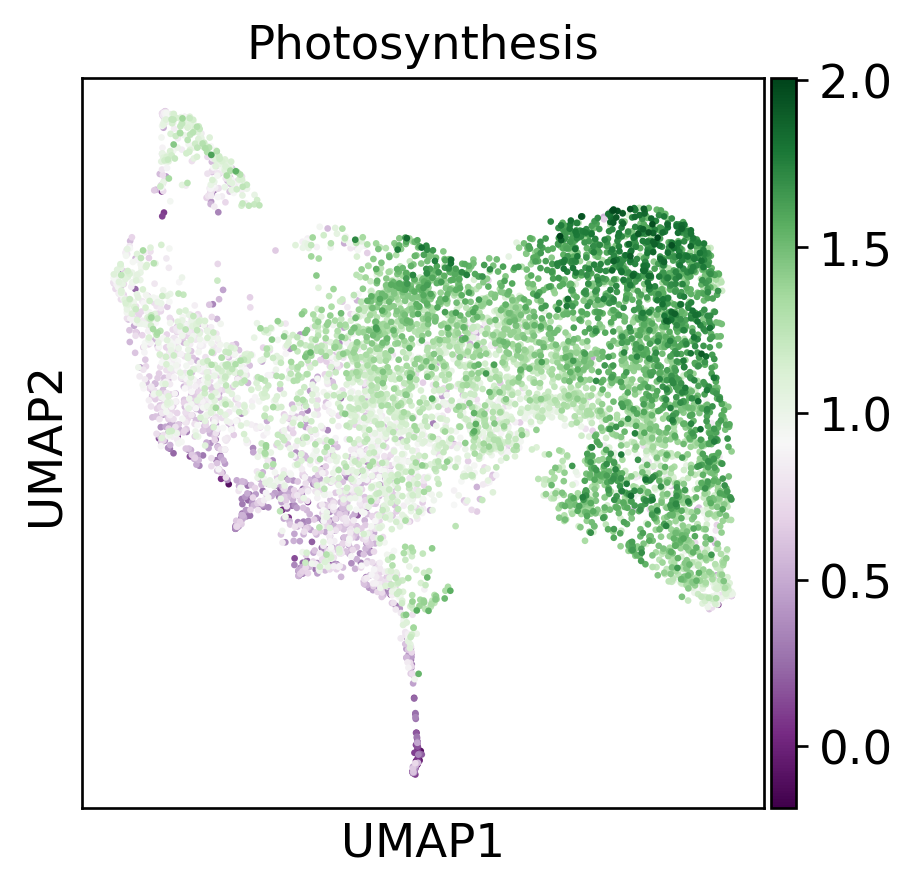

computing score 'ABA_response'
    finished: added
    'ABA_response', score of gene set (adata.obs).
    100 total control genes are used. (0:00:00)


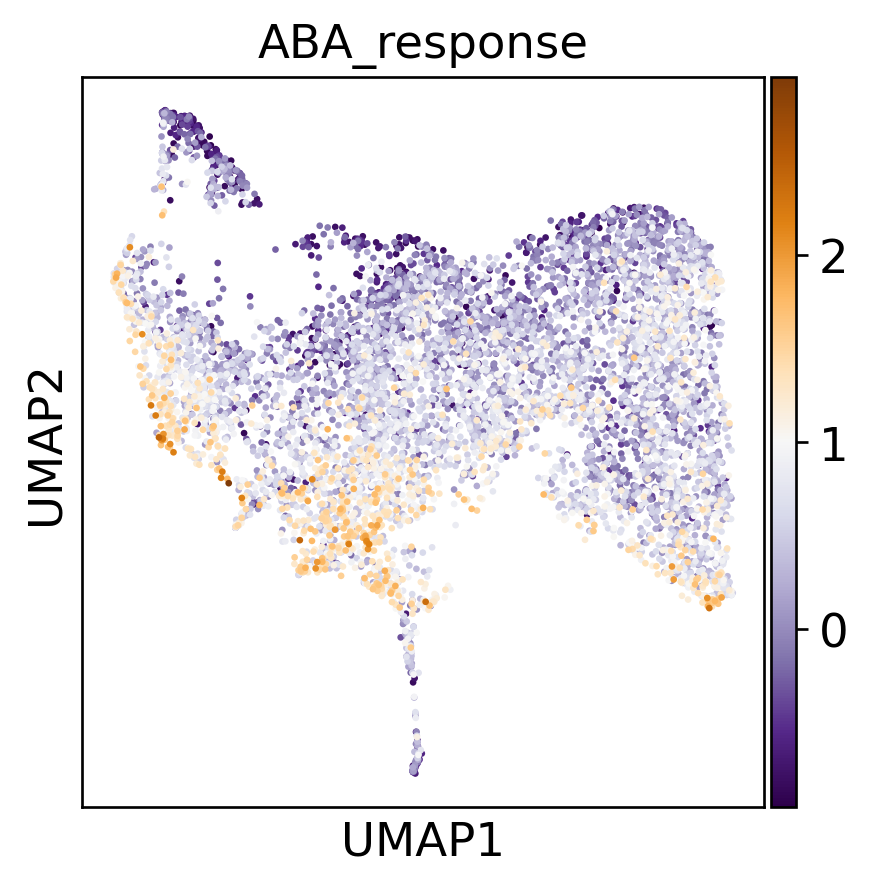

In [ ]:
sc.pl.umap(adata, color=['Photosynthesis'], color_map='PRGn', save='_photosynthesis.pdf')
sc.tl.score_genes(adata, gene_list = ['Mp6g07540', 'Mp6g13390', 'Mp5g23710'], score_name="ABA_response") # 'Mp5g23710' optional
sc.pl.umap(adata, color=['ABA_response'], color_map='PuOr_r', save='_ABA_response.pdf')

In [ ]:
sc.pl.matrixplot(adata, [ 'Mp5g19620', 'Mp3g17350'], groupby='leiden_anno',  cmap='Greys', standard_scale='var', save="_MpPIF_MpHY5.pdf")
HY5_genes_dict = {'MpHY5': 'Mp5g19620',
                     'COP1 candidates': ['Mp5g12010', 'Mp1g22680', 'Mp2g18040', 'Mp3g25460'],
                     'MpDDB1': 'Mp4g15990',
                  'MpCUL4': 'Mp1g07340', 
                     'MpDET1': 'Mp8g00970'} 
sc.pl.matrixplot(adata, HY5_genes_dict, groupby='leiden_anno',  cmap='Greys', standard_scale='var', save="_MpHY5.pdf")
PIF_genes_dict = {'MpPIF': 'Mp3g17350',
                     'PIN2-5': ['Mp5g05140', 'Mp6g07950', 'Mp5g05150', 'Mp5g05180'],
                     'PILS2-3':  ['Mp5g19620', 'Mp5g12650']} 
sc.pl.matrixplot(adata, PIF_genes_dict, groupby='leiden_anno',  cmap='Greys', standard_scale='var', save="_MpPIF_MpPIN2-5_MpPILS2-3.pdf")


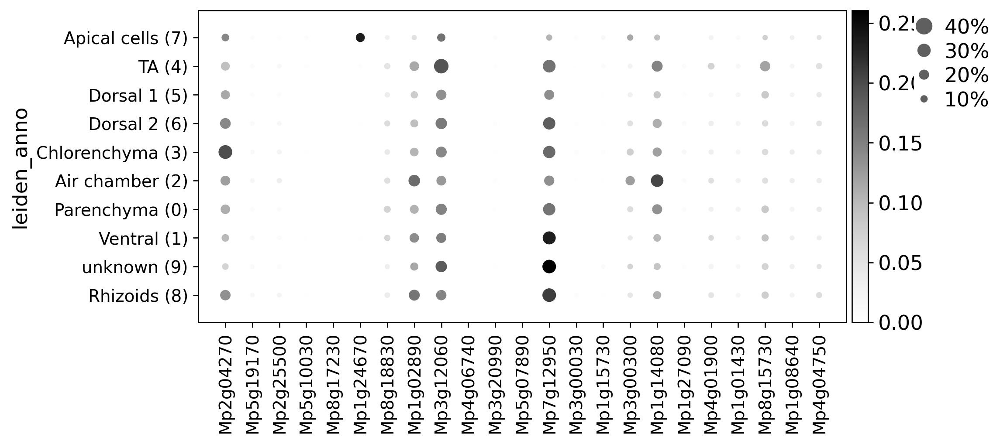

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[8.049999999999999, 0, 0.2, 0.5, 0.25])

In [ ]:

# Cell cycle regulators
sc.pl.dotplot(adata, ['Mp2g04270','Mp5g19170','Mp2g25500','Mp5g10030','Mp8g17230','Mp1g24670','Mp8g18830','Mp1g02890','Mp3g12060',
                      'Mp4g06740','Mp3g20990','Mp5g07890','Mp7g12950','Mp3g00030','Mp1g15730','Mp3g00300',
                      'Mp1g14080','Mp1g27090','Mp4g01900','Mp1g01430','Mp8g15730','Mp1g08640','Mp4g04750'], groupby='leiden_anno',  
              color_map='Greys', smallest_dot=10, save="_cell_cycle.pdf")



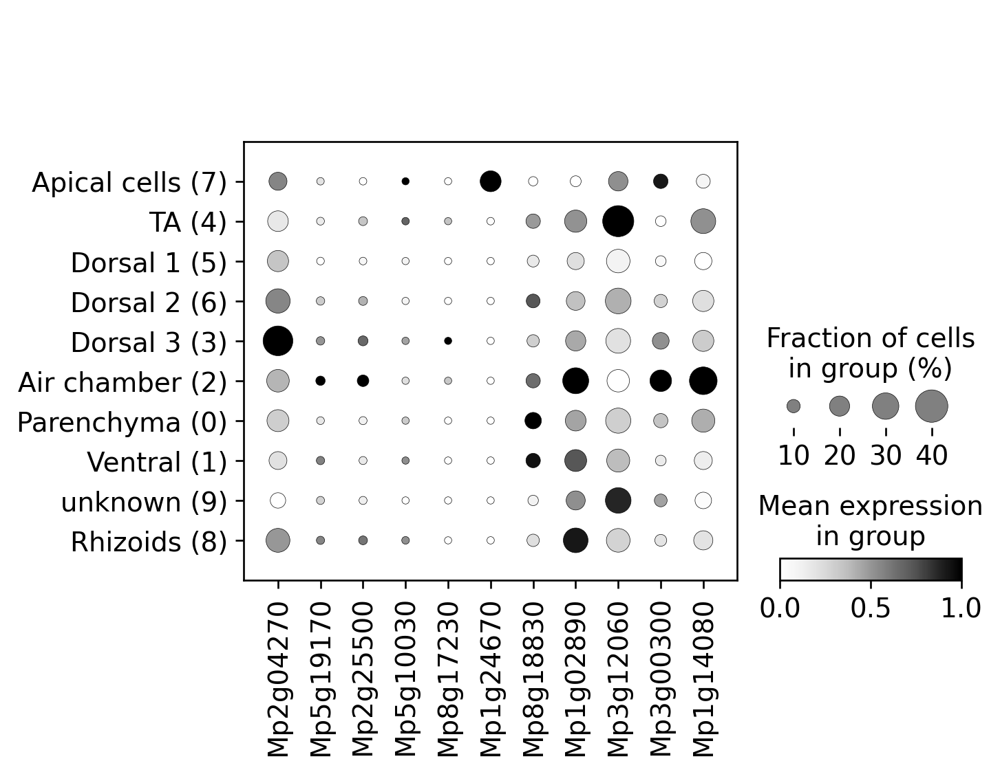

In [ ]:
# Cyclins only
sc.pl.dotplot(adata, ['Mp2g04270','Mp5g19170','Mp2g25500','Mp5g10030', 'Mp8g17230','Mp1g24670', 'Mp8g18830', 'Mp1g02890', 'Mp3g12060', 'Mp3g00300', 'Mp1g14080'], groupby='leiden_anno',  
              color_map='Greys', smallest_dot=10, standard_scale='var',save="_cyclins.pdf")


### Hormone signalling

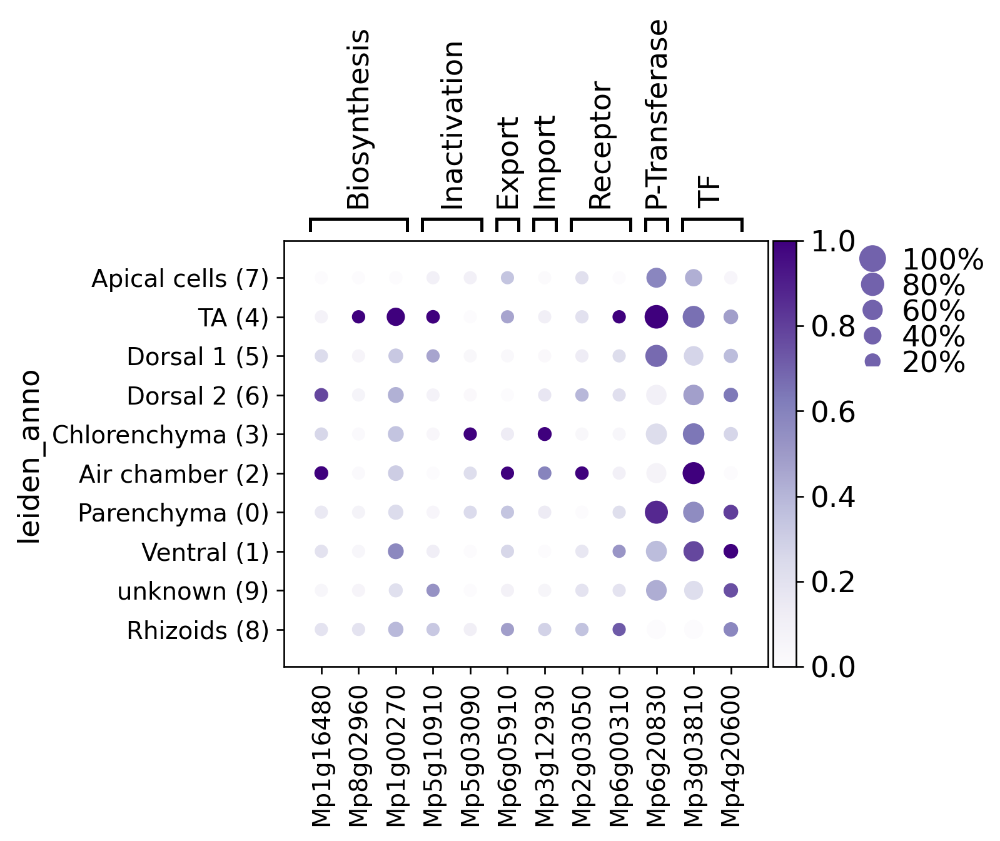

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[4.199999999999999, 0, 0.2, 0.5, 0.25])

In [ ]:
cyt_genes_dict = {'Biosynthesis': ['Mp1g16480', 'Mp8g02960', 'Mp1g00270'],
                     'Inactivation': ['Mp5g10910', 'Mp5g03090'],
                     'Export': 'Mp6g05910', 
                    'Import': 'Mp3g12930',
                     'Receptor': ['Mp2g03050', 'Mp6g00310'],
                     'P-Transferase': 'Mp6g20830',
                     'TF': ['Mp3g03810', 'Mp4g20600']
                     }
sc.pl.dotplot(adata, cyt_genes_dict, groupby='leiden_anno', standard_scale='var', smallest_dot=40, color_map='Purples', save="_cytokinin.pdf")

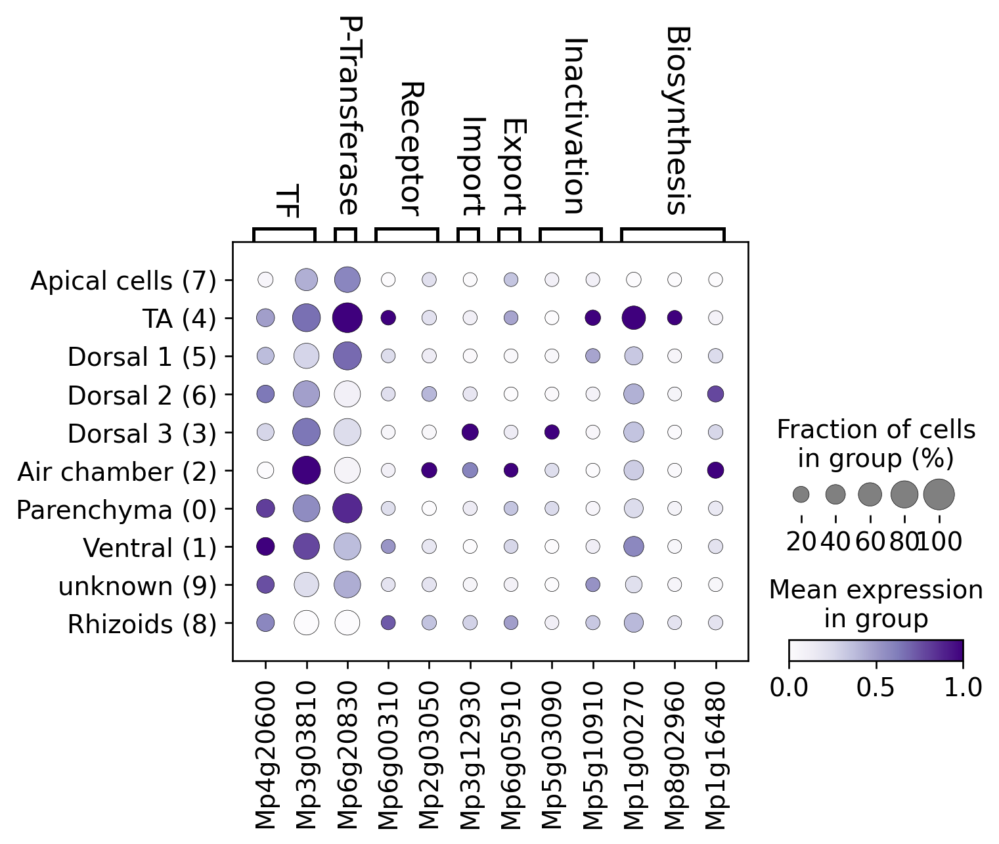

In [ ]:
cyt_genes_dict_rev = { 'TF': ['Mp4g20600', 'Mp3g03810'], 
                  'P-Transferase': 'Mp6g20830',
                     'Receptor': ['Mp6g00310', 'Mp2g03050'],
                    'Import': 'Mp3g12930',
                     'Export': 'Mp6g05910', 
                     'Inactivation': ['Mp5g03090', 'Mp5g10910'],
                    'Biosynthesis': ['Mp1g00270', 'Mp8g02960', 'Mp1g16480']
                     }
sc.pl.dotplot(adata, cyt_genes_dict_rev, groupby='leiden_anno', standard_scale='var', smallest_dot=40, color_map='Purples', save="_cytokinin_rev.pdf", var_group_rotation=270)

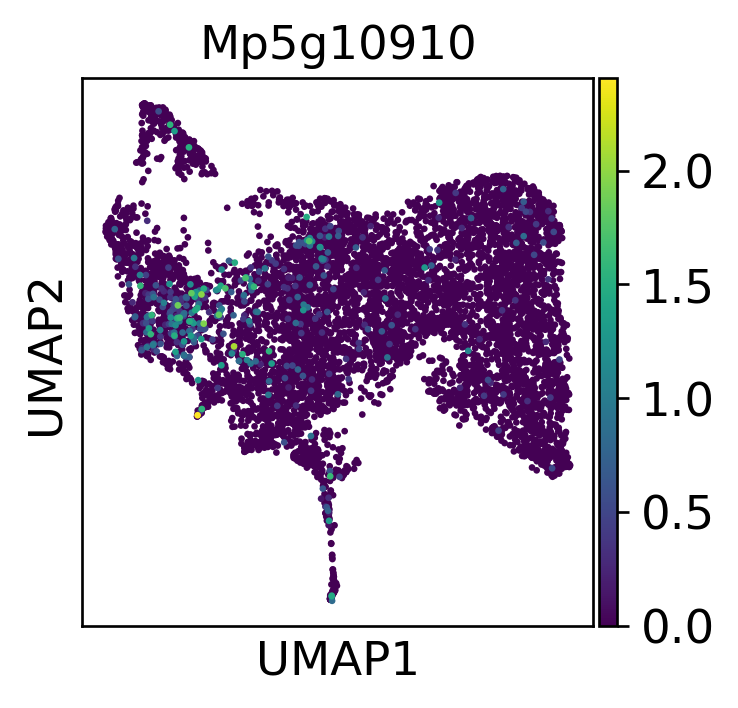

In [ ]:
sc.settings.set_figure_params(figsize=(3,3), dpi=120)
sc.pl.umap(adata, color=['Mp5g10910'], save="_CKX1.pdf")
sc.settings.set_figure_params(figsize=None, dpi=120)


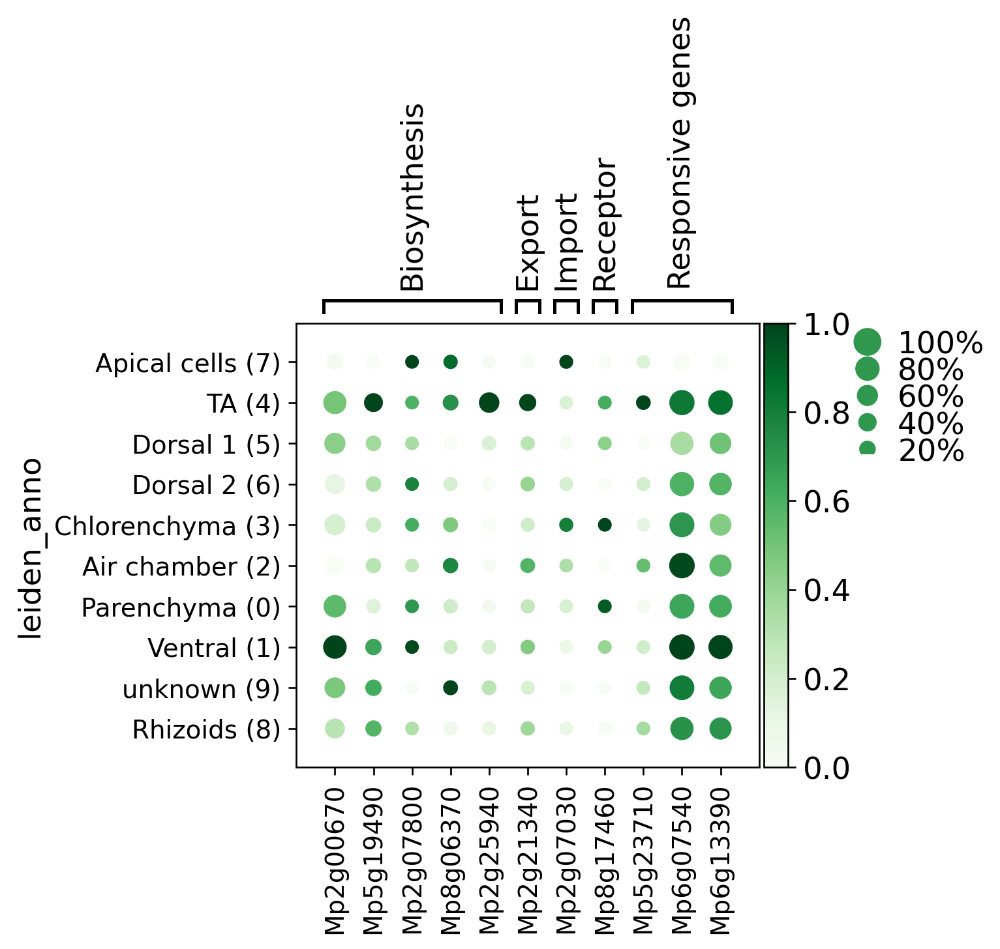

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[3.8499999999999996, 0, 0.2, 0.5, 0.25])

In [ ]:
# ABA signalling 

aba_genes_dict = {'Biosynthesis': ['Mp2g00670','Mp5g19490', 'Mp2g07800', 'Mp8g06370', 'Mp2g25940'],
                     'Export': 'Mp2g21340',
                     'Import': 'Mp2g07030',
                     'Receptor': ['Mp8g17460'],
                     'Responsive genes': ['Mp5g23710', 'Mp6g07540', 'Mp6g13390']
                     }

sc.pl.dotplot(adata, aba_genes_dict,
              standard_scale='var',groupby='leiden_anno',  color_map='Greens', smallest_dot=40, save="_ABA.pdf")

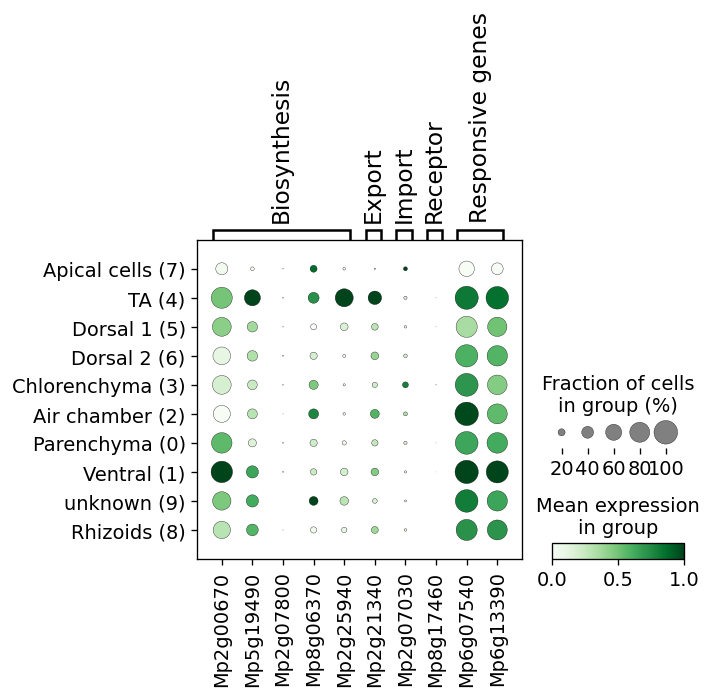

In [ ]:
aba_genes_dict = {'Biosynthesis': ['Mp2g00670','Mp5g19490', 'Mp2g07800', 'Mp8g06370', 'Mp2g25940'],
                     'Export': 'Mp2g21340',
                     'Import': 'Mp2g07030',
                     'Receptor': ['Mp8g17460'],
                     'Responsive genes': ['Mp6g07540', 'Mp6g13390']
                     }

sc.pl.dotplot(adata, aba_genes_dict,
              standard_scale='var',groupby='leiden_anno',  color_map='Greens', smallest_dot=40, save="_ABA.pdf")

computing score 'ABA_response'
    finished: added
    'ABA_response', score of gene set (adata.obs).
    100 total control genes are used. (0:00:00)


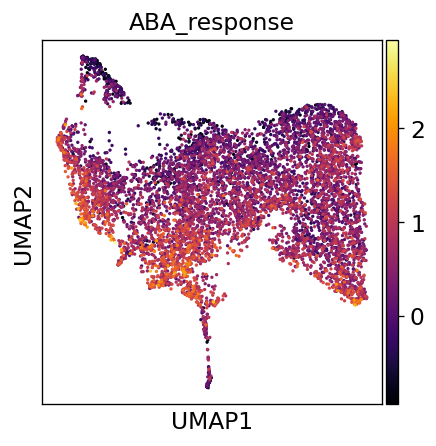

In [ ]:
sc.tl.score_genes(adata, gene_list = ['Mp6g07540', 'Mp6g13390', 'Mp5g23710'], score_name="ABA_response") # 'Mp5g23710' optional
sc.pl.umap(adata, color=['ABA_response'], color_map="inferno", save="_ABA_response.png")

array([[ 1.        , -0.26391747],
       [-0.26391747,  1.        ]])

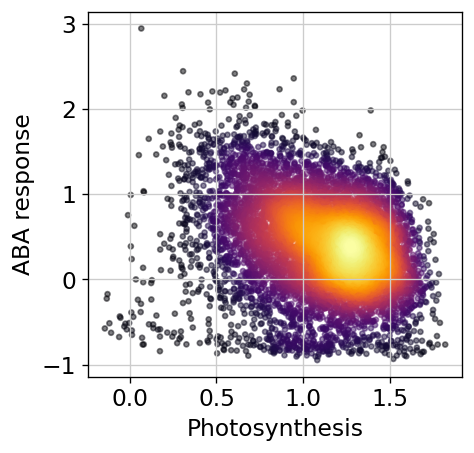

In [ ]:
from scipy.stats import gaussian_kde
x = adata.obs['Photosynthesis']
y = adata.obs['ABA_response']
# 4d_sc vs 4d
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
idx = z.argsort()
x1, y1, z = x[idx], y[idx], z[idx]

plt.scatter(x1, y1, alpha=0.5, marker='.', c=z, cmap='inferno')
plt.xlabel('Photosynthesis')
plt.ylabel('ABA response')
plt.savefig("figures/ABA_phot_corr.png")
np.corrcoef(x,y)

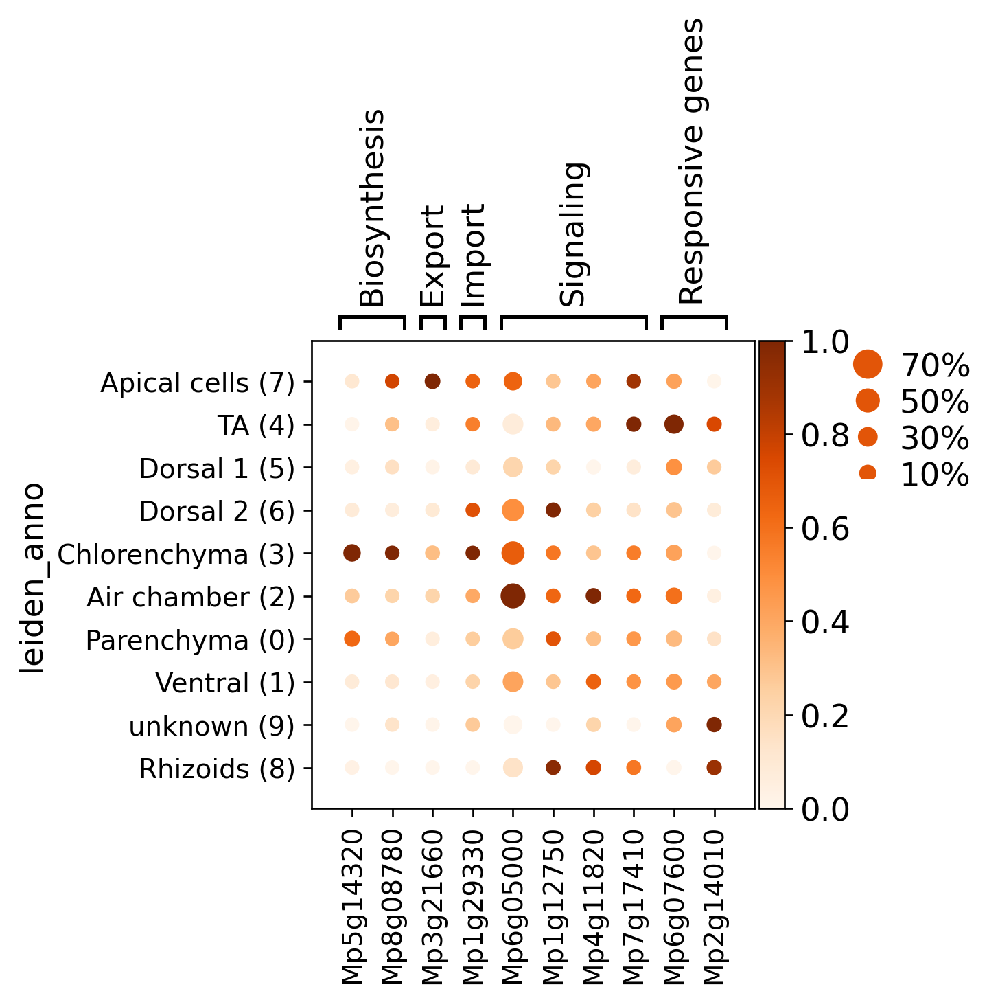

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [ ]:
# Auxin signalling
aux_genes_dict = {'Biosynthesis': ['Mp5g14320','Mp8g08780'],
                     'Export': 'Mp3g21660',
                     'Import': 'Mp1g29330',
                     'Signalling': ['Mp6g05000', 'Mp1g12750', 'Mp4g11820', 'Mp7g17410'], 
                     'Responsive genes': ['Mp6g07600', 'Mp2g14010']
                     }

sc.pl.dotplot(adata, aux_genes_dict, groupby='leiden_anno', standard_scale='var', color_map='Oranges', smallest_dot=40, save="_auxin.pdf")

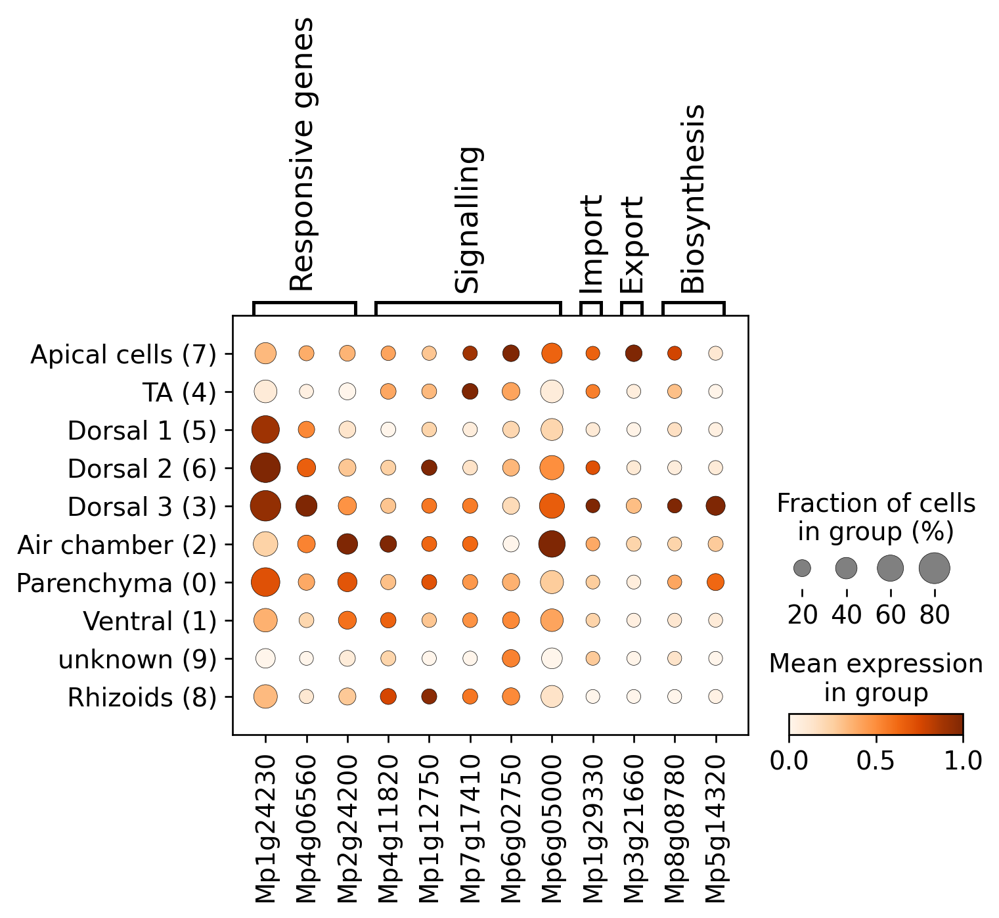

In [ ]:
aux_genes_rev_dict = {'Responsive genes': ['Mp1g24230', 'Mp4g06560', 'Mp2g24200'],
                      'Signalling': ['Mp4g11820', 'Mp1g12750', 'Mp7g17410', 'Mp6g02750', 'Mp6g05000'],
                      'Import': 'Mp1g29330',
                      'Export': 'Mp3g21660',
                      'Biosynthesis': ['Mp8g08780', 'Mp5g14320'],
                     }
# 'Mp2g14010', 'Mp6g07600' GH3 genes
# 'Mp2g02890', 'Mp8g07850' alternative AUX/IAA genes
sc.pl.dotplot(adata, aux_genes_rev_dict, groupby='leiden_anno', standard_scale='var', color_map='Oranges', smallest_dot=40, save="_auxin_rev.pdf")

computing score 'Aux_up'
    finished: added
    'Aux_up', score of gene set (adata.obs).
    896 total control genes are used. (0:00:00)
computing score 'Aux_down'
    finished: added
    'Aux_down', score of gene set (adata.obs).
    946 total control genes are used. (0:00:00)


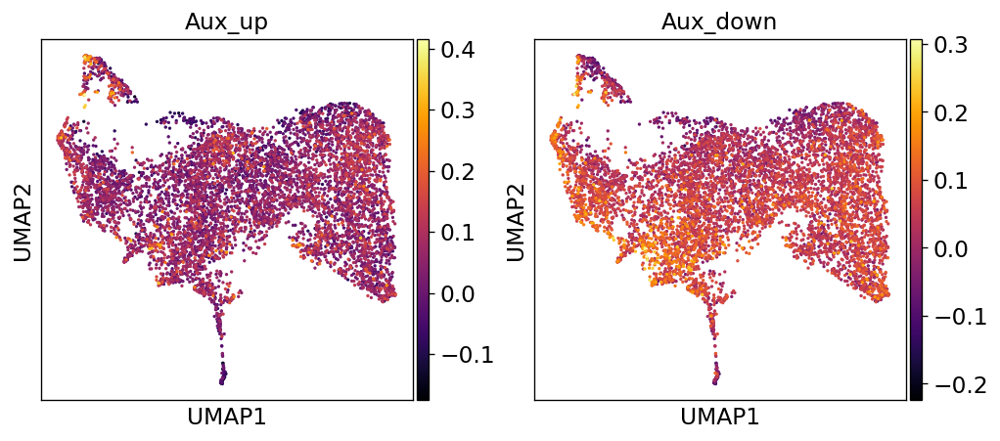

In [ ]:
aux_genes_up = pd.read_table("Aux_genes_up.txt", header=None)
aux_genes_up = aux_genes_up[1]
aux_genes_down = pd.read_table("Aux_genes_down.txt", header=None)
aux_genes_down = aux_genes_down[1]

sc.tl.score_genes(adata, gene_list = aux_genes_up[1:50], score_name="Aux_up") 
sc.tl.score_genes(adata, gene_list = aux_genes_down[1:50], score_name="Aux_down") 
sc.pl.umap(adata, color=['Aux_up', 'Aux_down'], color_map="inferno", save="_aux_ind_genes.pdf")

## Subset datasets 

In [ ]:
adata_r = anndata.read_h5ad("5.1_f_raw.h5ad")

In [ ]:
adata_R = adata_r[adata.obs['leiden'].isin(['8'])]

In [ ]:
adata_R.write("5.1_R_only.h5ad")

## Bulk data correlation

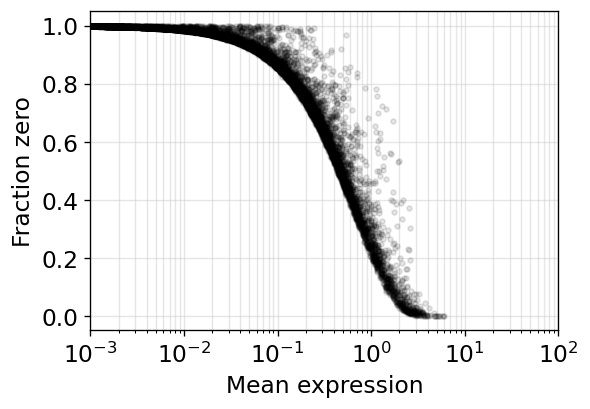

In [ ]:
# zero count distribution

adata.var['percent_zero'] = 1-(adata.var['n_cells']/len(adata.obs))
x = adata.var['means']
y = adata.var['percent_zero']
plt.rc('axes', axisbelow=True)
plt.figure(figsize=(5,3.5))
plt.scatter(x,y, marker='.',c='k', alpha=0.1)
plt.xlim(0.001,100)
plt.xscale('log')
plt.grid(True, which="minor", alpha=0.5)
plt.grid(True, which="major", alpha=0.5)
plt.xlabel("Mean expression")
plt.ylabel("Fraction zero")
plt.savefig("figures/fraction_zero.png")


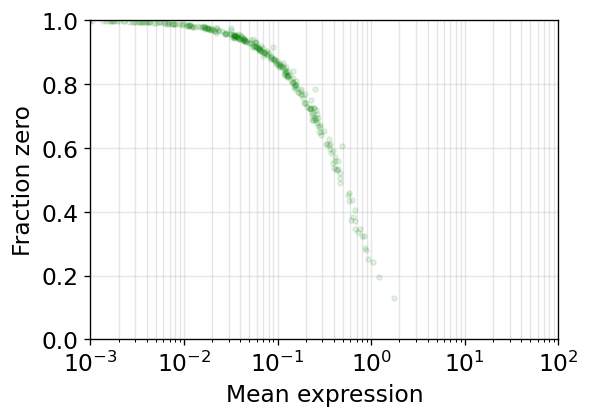

In [ ]:
tfs = pd.read_table('../genome/annotation/tfs_5.1.tsv')
x = adata.var[np.isin(adata.var['gene_name'], tfs['5.1_ID'])]['means']
y = adata.var[np.isin(adata.var['gene_name'], tfs['5.1_ID'])]['percent_zero']
plt.rc('axes', axisbelow=True)
plt.figure(figsize=(5,3.5))
plt.scatter(x,y, marker='.',c='g', alpha=0.1)
plt.xlim(0.001,100)
plt.ylim(0,1)
plt.xscale('log')
plt.grid(True, which="minor", alpha=0.5)
plt.grid(True, which="major", alpha=0.5)
plt.xlabel("Mean expression")
plt.ylabel("Fraction zero")
plt.savefig("figures/fraction_zero_tfs.png")


In [ ]:
adata_r = anndata.read_h5ad("5.1_f_raw.h5ad")
adata.var['UMI_count'] = np.asarray(adata_r.X.sum(axis=0))[0,:]

In [ ]:
pd.DataFrame(adata.var).to_csv("var.txt", header=True, index=True)

In [ ]:
bulk_corr = pd.read_csv("bulk_corr.csv", index_col= 0, sep=",")
bulk_corr = bulk_corr[(bulk_corr > 1).any(axis=1)]

In [ ]:
from scipy.stats import gaussian_kde
a, b, c, d = np.log10(bulk_corr['4d_thallus_sc']+1), np.log10(bulk_corr['4d_thallus']+1), np.log10(bulk_corr['9d_thallus']+1), np.log10(bulk_corr['antheridiophore']+1) 

# 4d_sc vs 4d
ab = np.vstack([a,b])
z = gaussian_kde(ab)(ab)
idx = z.argsort()
a1, b1, z = a[idx], b[idx], z[idx]

# 4d vs 9d
bc = np.vstack([b,c])
z1 = gaussian_kde(bc)(bc)
idx = z1.argsort()
b2, c1, z1 = b[idx], c[idx], z1[idx]

# 4d vs antheridiophore
bd = np.vstack([b,d])
z2 = gaussian_kde(bd)(bd)
idx = z2.argsort()
b3, d1, z2 = b[idx], d[idx], z2[idx]

# 4d_sc vs 9d
ac = np.vstack([a,c])
z3 = gaussian_kde(ac)(ac)
idx = z3.argsort()
a2, c2, z3 = a[idx], c[idx], z3[idx]

# 4d_sc vs antheridiophore
ad = np.vstack([a,d])
z4 = gaussian_kde(ad)(ad)
idx = z4.argsort()
a3, d2, z4 = a[idx], d[idx], z4[idx]

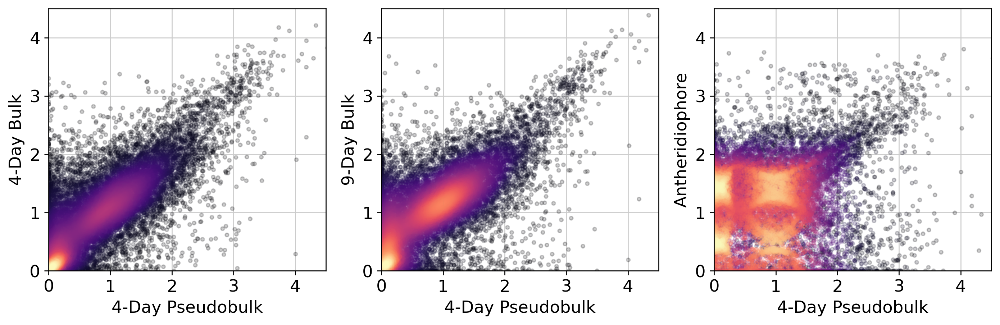

In [ ]:
plt.figure(figsize=(14,4))
plt.subplot(131)
plt.scatter(a1,b1, c=z, alpha=0.2, marker='.', cmap='magma')
plt.xlim(0,4.5)
plt.ylim(0,4.5)
plt.ylabel("4-Day Bulk")
plt.xlabel("4-Day Pseudobulk")
plt.subplot(132)
plt.scatter(a2, c2, c=z3, alpha=0.2, marker='.', cmap='magma')
plt.xlim(0,4.5)
plt.ylim(0,4.5)
plt.xlabel("4-Day Pseudobulk")
plt.ylabel("9-Day Bulk")
plt.subplot(133)
plt.scatter(a2, d2, c=z4, alpha=0.2, marker='.', cmap='magma')
plt.xlim(0,4.5)
plt.ylim(0,4.5)
plt.xlabel("4-Day Pseudobulk")
plt.ylabel("Antheridiophore")

plt.savefig("figures/bulk_corr_1.png")

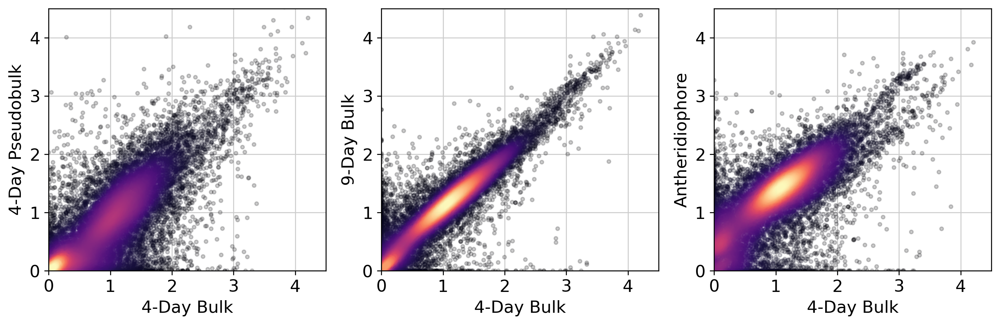

In [ ]:
plt.figure(figsize=(14,4))
plt.subplot(131)
plt.scatter(b1, a1, c=z, alpha=0.2, marker='.', cmap='magma')
plt.xlim(0,4.5)
plt.ylim(0,4.5)
plt.xlabel("4-Day Bulk")
plt.ylabel("4-Day Pseudobulk")
plt.subplot(132)
plt.scatter(b2, c1, c=z1, alpha=0.2, marker='.', cmap='magma')
plt.xlim(0,4.5)
plt.ylim(0,4.5)
plt.xlabel("4-Day Bulk")
plt.ylabel("9-Day Bulk")
plt.subplot(133)
plt.scatter(b3, d1, c=z2, alpha=0.2, marker='.', cmap='magma')
plt.xlim(0,4.5)
plt.ylim(0,4.5)
plt.xlabel("4-Day Bulk")
plt.ylabel("Antheridiophore")

plt.savefig("figures/bulk_corr_2.png")

In [ ]:
np.corrcoef(np.transpose(bulk_corr))

array([[1.        , 0.53935178, 0.59571287, 0.30118485],
       [0.53935178, 1.        , 0.91084534, 0.64054321],
       [0.59571287, 0.91084534, 1.        , 0.68946307],
       [0.30118485, 0.64054321, 0.68946307, 1.        ]])